In [1]:
# NOTE FOR LOCAL EXECUTION: use pytorch kernel and execute the code below to specify cuda device
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

# BERT and Explainable AI

## Load required libraries

In [2]:
!pip install pandas
!pip install transformers
!pip install transformers-interpret

## Import libraries

In [1]:
from utils import *
import pandas as pd
import pickle
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import SequenceClassificationExplainer

c:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\big_five\EXT\utils.py:10: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  auc_metric = load_metric("roc_auc", trust_remote_code=True)


## Load data

In [2]:
# Original data
#df = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\essays.csv", encoding = "latin-1")

# Alternatively, load fragmented validation and test partitions
df_train = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_train.csv")
df_valid = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_valid.csv")
df_test = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_test.csv")
#df = pd.concat([df_valid, df_test], axis=0, ignore_index=True)
df = df_test

# Another alternative, load training partition
#df = df_train

df.head()

,#AUTHID,TEXT,cEXT,cNEU,cAGR,cCON,cOPN
0,2000_999176.txt,spark up a conversation with a member of the o...,0,1,0,0,1
1,1999_915632.txt,well I just got back from my home town in hunt...,0,0,0,1,0
2,2000_515950.txt,"that I would not be like the rest, but an indi...",0,1,0,0,1
3,2000_935195.txt,So here are twenty minutes of Brian's thoughts...,0,0,0,1,1
4,2000_933158.txt,know it they'll be a big nobody in the world. ...,1,1,1,1,1


In [5]:
print(len(df))

703


## Define Trait

In [3]:
trait = "cEXT"

## Load the fine-tuned model

In [4]:
# Path to the fine-tuned model
#model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\Agreeableness\results_agreeableness"  # my laptop
model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\fine_tuning_models\results_extraversion_fragm"

# Load the fine-tuned model and tokenizer
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name, do_lower_case=True)
fine_tuned_model = AutoModelForSequenceClassification.from_pretrained(model_path)
cls_explainer = SequenceClassificationExplainer(fine_tuned_model, tokenizer)
print(cls_explainer.device)

cpu


  0%|          | 0/88 [00:00<?, ?it/s]

Trainer is attempting to log a value of "[[210 126]
 [141 226]]" of type <class 'numpy.ndarray'> for key "eval/conf_matrix" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.


{'eval_loss': 0.6644439697265625, 'eval_accuracy': 0.620199146514936, 'eval_roc_auc': 0.6204019073569482, 'eval_conf_matrix': array([[210, 126],
       [141, 226]], dtype=int64), 'eval_runtime': 360.6499, 'eval_samples_per_second': 1.949, 'eval_steps_per_second': 0.244}


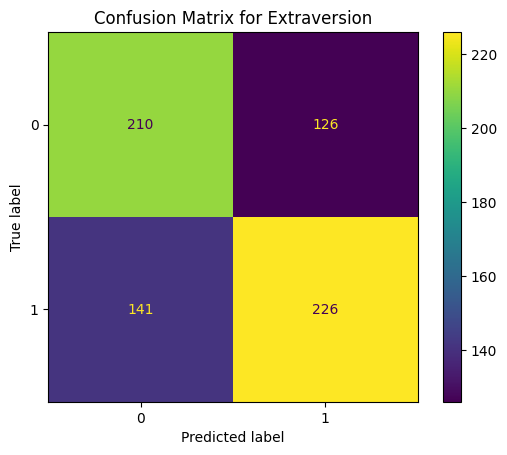

In [5]:
# Check that the model is correct

# Create datasets
X_train, X_valid, y_train, y_valid = create_partition_from_split(df_train, df_valid, 'TEXT', trait)
_, X_test, _, y_test = create_partition_from_split(df_train, df_test, 'TEXT', trait)
train_dataset, valid_dataset = create_datasets(tokenizer, X_train, X_valid, y_train, y_valid)
_, test_dataset = create_datasets(tokenizer, X_train, X_test, y_train, y_test)

# Create trainer
trainer = Trainer(
        model=fine_tuned_model,          # the instantiated Transformers model to be trained
        args=None,                       # training arguments
        train_dataset=train_dataset,     # training dataset
        eval_dataset=test_dataset,      # evaluation dataset
        compute_metrics=compute_metrics, # the callback that computes metrics of interest
        #optimizers=(optimizer, None)
    )

results = trainer.evaluate()
conf_matrix = results['eval_conf_matrix']
print(results)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()

# Add a title to the confusion matrix plot
plt.title("Confusion Matrix for Extraversion")
plt.show()

In [10]:
import pickle

# Set the desired maximum sequence length
max_sequence_length = 512
attribution_threshold = 0.5  # Adjust the threshold as needed

# List to store word attributions for each row
all_word_attributions = []

# List to store sum of attributions for each row
all_sum_attributions = []

# Loop through all rows in the dataset
print("Number of rows:", len(df))
for row_index in range(len(df)):
    # Show progress every 100 sentences
    if row_index%100 == 0:
        print(row_index)

    preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
    word_attributions = cls_explainer(preproc_text)
    true_class = df.loc[row_index, trait]
    predicted_class = cls_explainer.predicted_class_name

    # Print the terms with scores greater than the threshold
    for token, score in word_attributions:
        if abs(score) > attribution_threshold:
            print(f'Token: {token}, Score: {score}')

    # Save the filtered attributions for this row along with true_class and predicted_class
    attribution_info = (word_attributions, true_class, predicted_class)
    all_word_attributions.append(attribution_info)

    # Visualize if there are filtered attributions
    if any(abs(score) > attribution_threshold for _, score in word_attributions):
        cls_explainer.visualize(true_class=true_class)
    
    # Sum of attributions for the entire text
    sum_attribution = cls_explainer.attributions.attributions_sum.sum()

    # Save the sum of attributions for this row
    all_sum_attributions.append((sum_attribution.item(), true_class, predicted_class))
        
# Save all_word_attributions to a file
word_attr_fname = get_all_word_attr_fname_essays(trait)
with open(word_attr_fname, 'wb') as file:
    pickle.dump(all_word_attributions, file)

# Save all_sum_attributions to a file
sum_attr_fname = get_all_sum_attr_fname_essays(trait)
with open(sum_attr_fname, 'wb') as file:
    pickle.dump(all_sum_attributions, file)

Number of rows: 703
0
Token: !, Score: -0.6574582314402417


Token: and, Score: -0.5262854469360531


Token: cheryl, Score: 0.6865771578307088


Token: nicole, Score: 0.6603851093325475


Token: cody, Score: 0.8255330634124022


Token: valentin, Score: -0.6434482681086139


Token: numb, Score: 0.5176435719747555


Token: michelle, Score: 0.6818728992488141


Token: ##s, Score: 0.6748299007133882


Token: business, Score: 0.5221802143951866


Token: sorority, Score: 0.5287404764518719


Token: trinity, Score: 0.7273255912675917


Token: what, Score: -0.6454983863378639


Token: enfield, Score: 0.6830653851333919


Token: psychologists, Score: 0.7351894505424743


Token: psychologists, Score: -0.5233016507673676


Token: danny, Score: 0.8914363706895828


100
Token: iv, Score: 0.5164983349751793


Token: boyfriend, Score: 0.7136886816072957


Token: monica, Score: -0.5207984848934237


Token: alan, Score: -0.5463681476584223


Token: college, Score: 0.5173202283046534


Token: michelle, Score: 0.5673313742482569
Token: texas, Score: 0.5560056595508684


Token: boyfriend, Score: 0.5243650074589322


Token: stevens, Score: -0.5675716726046367


Token: he, Score: -0.6288958911560811


Token: ##bie, Score: 0.7332273252772656


Token: casey, Score: 0.5187019787666735


Token: /, Score: -0.5304471261578235


Token: austin, Score: 0.5586483201958846


Token: +, Score: 0.6718359436549426


Token: musical, Score: 0.5262602923540439


Token: jason, Score: 0.5556974510282093


Token: zach, Score: 0.8305304011668947


Token: houston, Score: 0.6561143674421926


Token: houston, Score: 0.7555210971488393


Token: raul, Score: 0.6007132812076942


Token: cristina, Score: 0.8304572662546175


Token: delilah, Score: 0.6007835126210429


Token: jeremy, Score: 0.567058248321792


Token: awesome, Score: 0.501935438180071


Token: eric, Score: -0.505165766449979


Token: president, Score: -0.5491394498678984


Token: sorority, Score: 0.5220961828168112


Token: arlington, Score: -0.5429819283189099


Token: cinderella, Score: -0.6051399504288083


Token: basketball, Score: 0.523207731888219


Token: lindsey, Score: 0.5923468130687567


Token: guys, Score: 0.5354653484698456


Token: wesley, Score: 0.79160824388779


200
Token: perhaps, Score: 0.5248259085876265


Token: austin, Score: -0.6344844039249892


Token: tiffany, Score: 0.5251155160941502


Token: sorority, Score: 0.6556704286448666


Token: th, Score: 0.74312386337584


Token: fun, Score: -0.5492217211426864


Token: zack, Score: 0.8545211748784828


Token: tim, Score: 0.5651393167117098


Token: all, Score: 0.5249502748401514


Token: jacob, Score: 0.6665119842077701


Token: its, Score: 0.5589574980473804


Token: music, Score: -0.5271055152837104


Token: sorority, Score: 0.5418952939574011


Token: type, Score: 0.5696961886266405


Token: texas, Score: -0.7477864051377511


Token: lindsey, Score: -0.6587281998261085


Token: houston, Score: 0.5244704129277252


Token: college, Score: 0.5009791883428855


Token: shane, Score: 0.6243375585078476


Token: tracy, Score: -0.6610437360979868


Token: awesome, Score: -0.5029601352069117


Token: marissa, Score: 0.816303118573389


Token: justine, Score: 0.5359802510868574


Token: jack, Score: -0.8743976197895503


Token: mom, Score: -0.5408026163926895


Token: relativity, Score: -0.738415912324689


Token: hilarious, Score: 0.5225666466089738


Token: basketball, Score: 0.6078755030899595


300
Token: bryan, Score: 0.5779659809149514


Token: totally, Score: 0.5652593325928649


Token: kyle, Score: 0.8437713122680708


Token: houston, Score: -0.5746762045433939


Token: stacy, Score: 0.805546212051982


Token: sorority, Score: 0.5375664932756189


Token: such, Score: 0.529018408102426


Token: heidi, Score: 0.888572802974388


Token: mimi, Score: 0.8220218802376182


Token: /, Score: 0.7839055165592033


Token: difficult, Score: 0.5040610183067761


Token: casey, Score: 0.6273483852940953


Token: nick, Score: -0.5283557460564534


Token: &, Score: -0.5827285385774811


Token: totally, Score: -0.6290344744580761


Token: becky, Score: 0.7080196444851639


Token: im, Score: 0.6236434976248796


Token: /, Score: 0.5724883863616018
Token: /, Score: 0.5393198555667392


Token: ., Score: 0.6301231091321213


Token: olivia, Score: -0.6269196732602624


Token: fun, Score: 0.5115279319103059


Token: friend, Score: -0.5111398925716584


Token: im, Score: 0.5123080238591339


Token: bye, Score: 0.6455777578221856


Token: ##tyn, Score: -0.8088948942580773


Token: familiarity, Score: 0.6056504372529417


Token: rowing, Score: 0.6603188465631539


Token: totally, Score: 0.6697706234519148


Token: joseph, Score: 0.6688370415795224


400
Token: talmud, Score: 0.6682288324620606


Token: texas, Score: 0.5186101950821091


Token: austin, Score: 0.5775343418664862


Token: music, Score: 0.7076005910085353


Token: leah, Score: 0.678122662003036


Token: nadia, Score: 0.5407025345452027


Token: houston, Score: 0.6352111637515819


Token: cornell, Score: 0.7125198001481502


Token: jayne, Score: 0.699512154391628


Token: /, Score: -0.7668334728106443


Token: texas, Score: -0.513912378521624


Token: tyler, Score: 0.5747254919004895


Token: martin, Score: -0.7836800422383946


Token: corey, Score: -0.5132274108435283


Token: !, Score: 0.5948150933034089


Token: aimee, Score: 0.6620054468460733


Token: lexie, Score: 0.5422665559352157


Token: ii, Score: 0.6858009652979881


Token: its, Score: 0.7590322667002685


Token: ##sd, Score: -0.5046597110806752


Token: norma, Score: -0.6993311087581627


Token: very, Score: 0.53919873074213


Token: totally, Score: 0.6956029991355828


Token: vegas, Score: 0.5657236538928461


Token: awesome, Score: 0.5048931987686103


Token: enrique, Score: 0.8333272393180038


Token: texas, Score: 0.5670880008210382


Token: ryan, Score: 0.7278160118572096


Token: mom, Score: -0.5456009855169058


500
Token: !, Score: -0.7625403873595232


Token: jc, Score: 0.8142124348564647


Token: ., Score: 0.5368607790669452


Token: texas, Score: 0.5923934880671722


Token: perry, Score: 0.5728143790647028


Token: haley, Score: 0.5833919571841713


Token: sur, Score: -0.5675906905937403


Token: texas, Score: 0.7287402385210763


Token: armenian, Score: -0.567911391054253


Token: pack, Score: 0.5343468241103627


Token: /, Score: 0.9374889967586892


Token: ., Score: 0.5387621747724879


Token: texas, Score: -0.5190549306685858


Token: !, Score: -0.6104339530851234


Token: carrie, Score: 0.7254763462552057


Token: freshman, Score: 0.6731765664776379


Token: natalie, Score: 0.6153223055297282


Token: dell, Score: 0.5344051853487182


Token: !, Score: 0.8100237679419913


Token: to, Score: 0.5173046458906263


Token: /, Score: 0.8466831684829855


Token: houston, Score: 0.6083130757735978


Token: clements, Score: 0.5155957648984528


Token: bergman, Score: 0.5685789706378983
Token: artistic, Score: 0.525872472807611


Token: jacob, Score: -0.5545635040773269


Token: sorority, Score: 0.6372086639188538


Token: ., Score: 0.5835863189606882


Token: /, Score: 0.7954999222995821


600
Token: texas, Score: 0.6244158015463445


Token: lindsay, Score: 0.6631259132007192


Token: charms, Score: 0.617310192053596


Token: later, Score: 0.6815251600939418
Token: babe, Score: -0.5499541214933452


Token: ramon, Score: 0.5199886405496795


Token: houston, Score: 0.8550304805048334


Token: aaron, Score: 0.5555840479023325


Token: phoebe, Score: -0.6095416202539338


Token: judd, Score: 0.8730464557990193


Token: tiffany, Score: 0.7847957843495353


Token: michael, Score: -0.5555003691825653


Token: music, Score: -0.6396282763647911


Token: girls, Score: 0.5103279055503549


Token: brian, Score: -0.6285004170426104


Token: to, Score: 0.50779458865076


Token: cheerleading, Score: 0.514712282458411


Token: texas, Score: 0.5339609625062341


Token: ', Score: 0.5197404959950256


Token: wesley, Score: 0.5833122427938627


Token: /, Score: 0.6819679335619924


Token: texas, Score: 0.5622068075578909


Token: ., Score: -0.6009536927334881


Token: austin, Score: 0.5262106503918408


Token: catherine, Score: 0.5917815820876017
Token: totally, Score: -0.5653340828058118


Token: amanda, Score: -0.6697087810254669


700
Token: hispanic, Score: -0.519901964692397


In [5]:
import pickle

word_attr_fname = get_all_word_attr_fname_essays(trait)
sum_attr_fname = get_all_sum_attr_fname_essays(trait)

# Load the previously saved attributions from the file
with open(word_attr_fname, 'rb') as file:
    all_word_attributions = pickle.load(file)

# Load the previously saved attributions from the file
with open(sum_attr_fname, 'rb') as file:
    all_sum_attributions = pickle.load(file)

## Obtain Word Frequencies 

In [6]:
word_freq = get_word_freqs(all_word_attributions)
word_freq_label_1 = get_word_freqs(all_word_attributions, "LABEL_1")
word_freq_label_0 = get_word_freqs(all_word_attributions, "LABEL_0")

## Obtain Positive and Negative Attributions

In [7]:
# Get positive and negative attributions for the two labels
force_correct_classif=True
positive_attributions_label_1 = filter_attributions(all_word_attributions, '+', "LABEL_1", force_correct_classif)
positive_attributions_label_0 = filter_attributions(all_word_attributions, '+', "LABEL_0", force_correct_classif)
negative_attributions_label_1 = filter_attributions(all_word_attributions, '-', "LABEL_1", force_correct_classif)
negative_attributions_label_0 = filter_attributions(all_word_attributions, '-', "LABEL_0", force_correct_classif)

## Word Filtering Functions

In [8]:
#!pip install nltk

import nltk
from nltk.corpus import stopwords

# Obtain stop words
nltk.download('stopwords')
english_stopwords = stopwords.words('english')
#print(english_stopwords)

# Obtain list of words
nltk.download('words')
english_words = set(nltk.corpus.words.words())
#print(len(english_words))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Word Clouds
### By attribution score

In [9]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt

min_word_freq = 10
min_word_len = 4
sum_techniques = ["freq", "avg", "max", "accum", "gmean"]
#sum_techniques = ["avg"]

for sum_technique in sum_techniques:

    # Create separate lists for positive and negative attributions for LABEL_1
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len)
    positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len)
    negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

    # Create separate lists for positive and negative attributions for LABEL_0
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len)
    positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len)
    negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

    # Generate word clouds
    wordcloud_label_1_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_1)
    wordcloud_label_1_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_1)
    wordcloud_label_0_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_0)
    wordcloud_label_0_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_0)

    # Plot word clouds
    fig = plt.figure(figsize=(16, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(wordcloud_label_1_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(wordcloud_label_1_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(wordcloud_label_0_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(wordcloud_label_0_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.tight_layout()

    # Save the figure as a high-resolution image
    filename = f"Wordclouds_EXT_{sum_technique}.png"
    plt.savefig(filename, dpi = 300, bbox_inches = "tight")
    plt.close(fig)

## Barplots

In [10]:
min_word_freq = 10
sum_technique = "gmean"
# Create separate lists for positive and negative attributions for LABEL_1
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq)
positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq)
negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

# Create separate lists for positive and negative attributions for LABEL_0
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq)
positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq)
negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

# Plot horizontal bar plots for each category with both top and bottom significant words
plot_bar(positive_words_label_1, 'Positive Attributions (LABEL_1)', filename = "positive_label_1_barplot.png")
plot_bar(negative_words_label_1, 'Negative Attributions (LABEL_1)', filename = "negative_label_1_barplot.png")
plot_bar(positive_words_label_0, 'Positive Attributions (LABEL_0)', filename = "positive_label_0_barplot.png")
plot_bar(negative_words_label_0, 'Negative Attributions (LABEL_0)', filename = "negative_label_0_barplot.png")

Saved positive_label_1_barplot.png
Saved negative_label_1_barplot.png
Saved positive_label_0_barplot.png
Saved negative_label_0_barplot.png


## Histogram

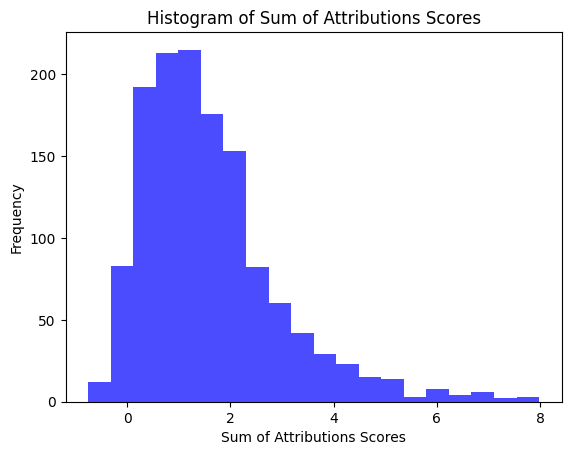

In [61]:
import matplotlib.pyplot as plt

# Create a histogram
filtered_sum_attributions = filter_sum_attributions(all_sum_attributions)
plt.hist(filtered_sum_attributions, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Sum of Attributions Scores')
plt.xlabel('Sum of Attributions Scores')
plt.ylabel('Frequency')
plt.show()

Percentile value: 0.65688379867948
Percentile value: 1.330292522375426
Percentile value: 2.1751696416963524


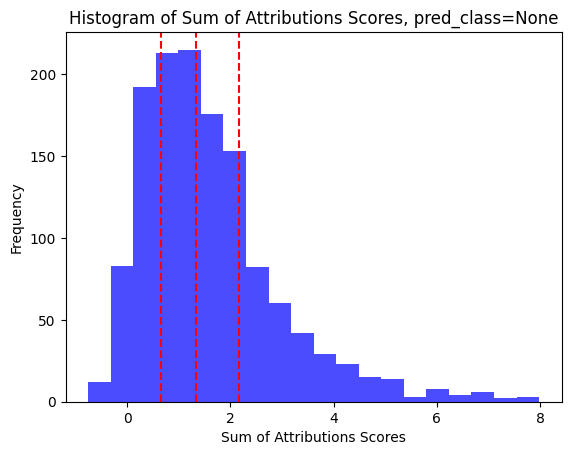

Percentile value: 0.5404534106638734
Percentile value: 1.1567418164244403
Percentile value: 1.7985240787087027


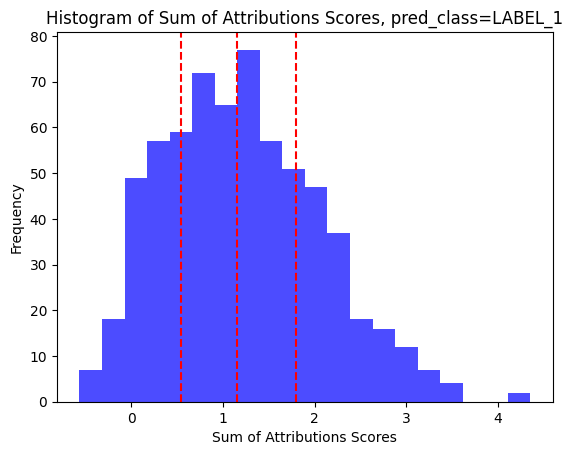

Percentile value: 0.8166970042677045
Percentile value: 1.6064625459230062
Percentile value: 2.830676150892856


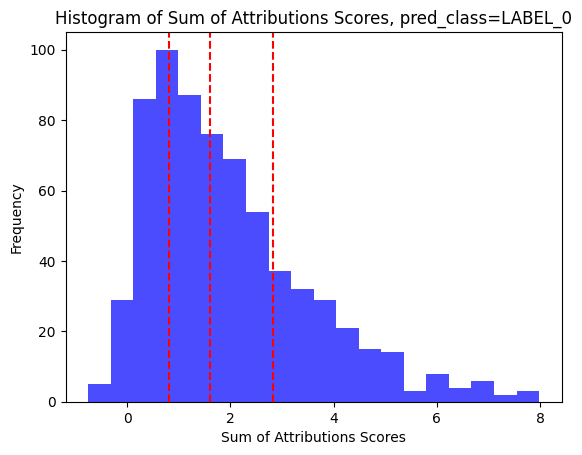

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Create histograms
for pred_class in [None, "LABEL_1", "LABEL_0"]:
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class)
    hist, bins, _ = plt.hist(sum_attributions, bins=20, color='blue', alpha=0.7)
    plt.title('Histogram of Sum of Attributions Scores, pred_class=' + str(pred_class))
    plt.xlabel('Sum of Attributions Scores')
    plt.ylabel('Frequency')

    # Calculate the percentiles
    percentiles = np.percentile(sum_attributions, [25, 50, 75])

    # Print the percentile values
    for percentile_value in percentiles:
        print("Percentile value:", percentile_value)

    # Draw red lines at the percentile values
    for percentile_value in percentiles:
        plt.axvline(percentile_value, color='red', linestyle='--')

    plt.show()

## Texts: highest scores

In [63]:
import numpy as np

# Set the desired maximum sequence length
max_sequence_length = 512

# Calculate the percentiles
# percentiles = np.percentile(all_total_attributions, [25, 75])

# Set the attribution threshold as the first and third percentile values
# attribution_threshold_lower = percentiles[0]
# attribution_threshold_upper = percentiles[1]

attribution_threshold_lower = -1.2264066739414712
attribution_threshold_upper = 3.9756553009835245

# Loop through all rows in the dataset
for row_index in range(len(df)):
    # Sum of attributions for the entire text
    sum_attribution = all_sum_attributions[row_index][0]

    # Check if the total attribution falls within the specified thresholds
    if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
        
        # Save the filtered attributions for this row
        attribution_info = (sum_attribution, true_class, predicted_class)

        # Print the information only for rows meeting the threshold
        print(f'True Class for Row {row_index}: {true_class}')
        print(f'Total Attribution for Row {row_index}: {sum_attribution}')

        # Visualize if needed
        if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
            cls_explainer.visualize(true_class=true_class)


True Class for Row 7: 1
Total Attribution for Row 7: 4.432656598544103


True Class for Row 24: 0
Total Attribution for Row 24: 7.395586889633658


True Class for Row 32: 1
Total Attribution for Row 32: 5.327871512164979


True Class for Row 73: 1
Total Attribution for Row 73: 4.961990357444062


True Class for Row 81: 0
Total Attribution for Row 81: 4.610482950802834


True Class for Row 89: 0
Total Attribution for Row 89: 6.887822893245424


True Class for Row 130: 0
Total Attribution for Row 130: 4.888757674394818


True Class for Row 142: 1
Total Attribution for Row 142: 5.118444026637524


True Class for Row 152: 0
Total Attribution for Row 152: 4.452118510569198


True Class for Row 153: 0
Total Attribution for Row 153: 4.681477907604735


True Class for Row 159: 0
Total Attribution for Row 159: 4.114322802925501


True Class for Row 163: 0
Total Attribution for Row 163: 6.099913441384121


True Class for Row 168: 0
Total Attribution for Row 168: 5.519193020327189


True Class for Row 175: 1
Total Attribution for Row 175: 4.400502468719335


True Class for Row 201: 1
Total Attribution for Row 201: 4.289430633732241


True Class for Row 208: 0
Total Attribution for Row 208: 5.907393101043868


True Class for Row 218: 0
Total Attribution for Row 218: 5.330509772083272


True Class for Row 224: 0
Total Attribution for Row 224: 4.59727533087387


True Class for Row 230: 0
Total Attribution for Row 230: 4.752491145348987


True Class for Row 241: 0
Total Attribution for Row 241: 7.9586773473867


True Class for Row 289: 0
Total Attribution for Row 289: 6.873125727027186


True Class for Row 300: 0
Total Attribution for Row 300: 4.849904662251083


True Class for Row 301: 1
Total Attribution for Row 301: 4.32650469180743


True Class for Row 358: 0
Total Attribution for Row 358: 4.89259152662833


True Class for Row 378: 0
Total Attribution for Row 378: 5.100935667799395


True Class for Row 395: 0
Total Attribution for Row 395: 6.397109799123611


True Class for Row 398: 0
Total Attribution for Row 398: 6.396882379417373


True Class for Row 428: 0
Total Attribution for Row 428: 4.089019119300971


True Class for Row 431: 1
Total Attribution for Row 431: 5.862185914251899


True Class for Row 432: 0
Total Attribution for Row 432: 6.181133007342177


True Class for Row 445: 1
Total Attribution for Row 445: 4.167796464218981


True Class for Row 455: 0
Total Attribution for Row 455: 5.14505901696424


True Class for Row 469: 0
Total Attribution for Row 469: 4.0186701609452


True Class for Row 497: 0
Total Attribution for Row 497: 5.705353090049107


True Class for Row 507: 1
Total Attribution for Row 507: 5.15169091168684


True Class for Row 522: 0
Total Attribution for Row 522: 5.088648781594851


True Class for Row 537: 0
Total Attribution for Row 537: 4.3224132871093826


True Class for Row 559: 1
Total Attribution for Row 559: 4.246855112193129


True Class for Row 563: 1
Total Attribution for Row 563: 4.076897786325617


True Class for Row 575: 0
Total Attribution for Row 575: 6.6796153567802925


True Class for Row 594: 1
Total Attribution for Row 594: 4.49277315747393


True Class for Row 620: 0
Total Attribution for Row 620: 6.562748364497664


True Class for Row 639: 1
Total Attribution for Row 639: 4.352736869006636


True Class for Row 657: 0
Total Attribution for Row 657: 4.047265420217329


True Class for Row 664: 0
Total Attribution for Row 664: 6.571810589275309


True Class for Row 665: 1
Total Attribution for Row 665: 4.154457109153474


True Class for Row 670: 0
Total Attribution for Row 670: 4.32464068371635


True Class for Row 677: 1
Total Attribution for Row 677: 4.090296158476834


True Class for Row 685: 0
Total Attribution for Row 685: 7.040489136067526


True Class for Row 692: 0
Total Attribution for Row 692: 4.196331360592673


True Class for Row 701: 1
Total Attribution for Row 701: 6.850420311596995


True Class for Row 709: 0
Total Attribution for Row 709: 5.4303811943154745


True Class for Row 772: 0
Total Attribution for Row 772: 4.521508790860308


True Class for Row 780: 0
Total Attribution for Row 780: 4.154829546455645


True Class for Row 819: 0
Total Attribution for Row 819: 4.727031931172952


True Class for Row 821: 1
Total Attribution for Row 821: 4.142045419071362


True Class for Row 827: 0
Total Attribution for Row 827: 7.657308785189828


True Class for Row 843: 0
Total Attribution for Row 843: 4.775024617141728


True Class for Row 866: 0
Total Attribution for Row 866: 5.323815310792725


True Class for Row 899: 0
Total Attribution for Row 899: 4.376247616863973


True Class for Row 929: 1
Total Attribution for Row 929: 4.080558002916348


True Class for Row 931: 0
Total Attribution for Row 931: 4.1268464924333905


True Class for Row 963: 1
Total Attribution for Row 963: 5.178807969814235


True Class for Row 979: 0
Total Attribution for Row 979: 4.1403350870742806


True Class for Row 986: 1
Total Attribution for Row 986: 4.8676132330596715


True Class for Row 1011: 1
Total Attribution for Row 1011: 5.188752833347039


True Class for Row 1023: 1
Total Attribution for Row 1023: 4.49658659252637


True Class for Row 1032: 1
Total Attribution for Row 1032: 5.151302491646611


True Class for Row 1086: 0
Total Attribution for Row 1086: 7.226463794492005


True Class for Row 1094: 1
Total Attribution for Row 1094: 5.825818271347658


True Class for Row 1103: 0
Total Attribution for Row 1103: 4.111741375991377


True Class for Row 1111: 0
Total Attribution for Row 1111: 7.073222521471969


True Class for Row 1137: 0
Total Attribution for Row 1137: 6.109623297484935


True Class for Row 1138: 1
Total Attribution for Row 1138: 4.81020403768222


True Class for Row 1251: 1
Total Attribution for Row 1251: 5.25419300684035


True Class for Row 1263: 0
Total Attribution for Row 1263: 4.839531454920861


True Class for Row 1294: 1
Total Attribution for Row 1294: 6.20607869562474


True Class for Row 1310: 0
Total Attribution for Row 1310: 5.333438661709587


True Class for Row 1322: 1
Total Attribution for Row 1322: 5.938197445193842


True Class for Row 1331: 1
Total Attribution for Row 1331: 7.981614395946826


## Visualize sorted lists (explainer)

In [67]:
# Set the desired maximum sequence length
max_sequence_length = 512

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        print(all_sum_attributions[row_index], sum_attribution)

        # Visualize the attributions for the text
        cls_explainer.visualize(true_class=true_class)

(7.981614395946826, 1, 'LABEL_0') tensor(7.9816, device='cuda:0', dtype=torch.float64)


(7.9586773473867, 0, 'LABEL_0') tensor(7.9587, device='cuda:0', dtype=torch.float64)


(7.657308785189828, 0, 'LABEL_0') tensor(7.6573, device='cuda:0', dtype=torch.float64)


(7.395586889633658, 0, 'LABEL_0') tensor(7.3956, device='cuda:0', dtype=torch.float64)


(7.226463794492005, 0, 'LABEL_0') tensor(7.2265, device='cuda:0', dtype=torch.float64)


(7.073222521471969, 0, 'LABEL_0') tensor(7.0732, device='cuda:0', dtype=torch.float64)


(7.040489136067526, 0, 'LABEL_0') tensor(7.0405, device='cuda:0', dtype=torch.float64)


(6.887822893245424, 0, 'LABEL_0') tensor(6.8878, device='cuda:0', dtype=torch.float64)


(6.873125727027186, 0, 'LABEL_0') tensor(6.8731, device='cuda:0', dtype=torch.float64)


(6.850420311596995, 1, 'LABEL_0') tensor(6.8504, device='cuda:0', dtype=torch.float64)


(4.352736869006636, 1, 'LABEL_1') tensor(4.3527, device='cuda:0', dtype=torch.float64)


(4.154457109153474, 1, 'LABEL_1') tensor(4.1545, device='cuda:0', dtype=torch.float64)


(3.5268633750510405, 0, 'LABEL_1') tensor(3.5269, device='cuda:0', dtype=torch.float64)


(3.456710850530027, 1, 'LABEL_1') tensor(3.4567, device='cuda:0', dtype=torch.float64)


(3.4145209255743554, 0, 'LABEL_1') tensor(3.4145, device='cuda:0', dtype=torch.float64)


(3.3713772694174087, 1, 'LABEL_1') tensor(3.3714, device='cuda:0', dtype=torch.float64)


(3.2789768528593055, 1, 'LABEL_1') tensor(3.2790, device='cuda:0', dtype=torch.float64)


(3.2632019031340254, 1, 'LABEL_1') tensor(3.2632, device='cuda:0', dtype=torch.float64)


(3.2496709508525883, 0, 'LABEL_1') tensor(3.2497, device='cuda:0', dtype=torch.float64)


(3.2219925877070708, 1, 'LABEL_1') tensor(3.2220, device='cuda:0', dtype=torch.float64)


(7.981614395946826, 1, 'LABEL_0') tensor(7.9816, device='cuda:0', dtype=torch.float64)


(7.9586773473867, 0, 'LABEL_0') tensor(7.9587, device='cuda:0', dtype=torch.float64)


(7.657308785189828, 0, 'LABEL_0') tensor(7.6573, device='cuda:0', dtype=torch.float64)


(7.395586889633658, 0, 'LABEL_0') tensor(7.3956, device='cuda:0', dtype=torch.float64)


(7.226463794492005, 0, 'LABEL_0') tensor(7.2265, device='cuda:0', dtype=torch.float64)


(7.073222521471969, 0, 'LABEL_0') tensor(7.0732, device='cuda:0', dtype=torch.float64)


(7.040489136067526, 0, 'LABEL_0') tensor(7.0405, device='cuda:0', dtype=torch.float64)


(6.887822893245424, 0, 'LABEL_0') tensor(6.8878, device='cuda:0', dtype=torch.float64)


(6.873125727027186, 0, 'LABEL_0') tensor(6.8731, device='cuda:0', dtype=torch.float64)


(6.850420311596995, 1, 'LABEL_0') tensor(6.8504, device='cuda:0', dtype=torch.float64)


## Trial

In [9]:
# Define a function to get the HTML file name
def get_html_fname(pred_class):
    return 'attributions_' + pred_class + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Initialize the HTML content
html_content = "<html><head><title>Essays with highest scores</title></head><body>"

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        # Add the information to the HTML content
        html_content += f"<p>{all_sum_attributions[row_index]}, {sum_attribution}</p>"

        # Visualize the attributions for the text
        explanation_html = cls_explainer.visualize(true_class=true_class).data

        # Add the text to the HTML content
        html_content += str(explanation_html)

    # Close the HTML content
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname(pred_class)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

    # Reset the HTML content for the next pred_class
    html_content = "<html><body>"

## Visualize sentences with a particular word (sum attribution ordering)

In [9]:
def get_html_fname_essays(word_of_interest):
    return 'avg_essay_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Define the list of words of interest and other parameters
words_of_interest = ["professor", "suppose", "song", "hand", "death"]
pred_class_of_interest = "LABEL_1"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get filtered sum attributions
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class_of_interest, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    num_elem = 0
    for element in sorted_list:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        if score is not None:
            # Extract row information
            preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
            word_attributions = cls_explainer(preproc_text)
            true_class = df.loc[row_index, trait]
            predicted_class = cls_explainer.predicted_class_name
            
            # Print score
            print(word_of_interest, "score:", score)

            # Visualize and collect HTML content
            explanation_html = cls_explainer.visualize(true_class=true_class).data
            html_content += f"<h3>{word_of_interest} score: {score}</h3>"
            html_content += str(explanation_html)  # Ensure conversion to string
            
            num_elem += 1
            if num_elem == max_elements_to_show:
                break

    # Close the HTML content
    html_content += "</body></html>"

    # Close the HTML file name
    html_fname = get_html_fname_essays(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)


professor score: -0.21039766290985568


professor score: 0.2169240410441806


professor score: -0.11339616866294919


professor score: -0.06304296392531836


professor score: 0.0670348250845292


professor score: -0.016577991745618997


professor score: -0.11493705454514552


professor score: 0.10575882351737625


professor score: -0.01544107711134832


professor score: 0.4073770803987535


suppose score: -0.02700703610430096


suppose score: -0.1312045133083687


suppose score: -0.011070397015683865


suppose score: -0.0829171056608741


suppose score: -0.037502982856506495


suppose score: -0.009842033941100998


suppose score: 0.02101155987288361


suppose score: 0.247217541127658


suppose score: -0.006507872466379968


song score: 0.002445937184636307


song score: 0.215771366749381


song score: -0.011751654069383922


song score: -0.09697550972692151


song score: -0.07914232380697908


song score: 0.01880562874087603


song score: 0.04393806930317836


song score: 0.11954745282328096


song score: -0.06789602213278814


song score: -0.011794603351176962


hand score: 0.010199951125253638


hand score: 0.002218219548102063


hand score: 0.010835234400375


hand score: -0.010095417332692038


hand score: 0.05116472255252005


hand score: -0.04054640621546308


hand score: -0.09691371868895074


hand score: -0.015095477644266038


hand score: 0.026825185616402566


hand score: -0.0017177266840177575


death score: 0.11846919669367231


death score: 0.09428985471220631


death score: 0.06411437552568676


death score: 0.06504511339183638


death score: 0.09696926294579054


death score: 0.14239791950103575


death score: 0.09129409868704506


death score: 0.18062842358408226


death score: 0.09367696706188211


## Visualize sentences with a particular word (word attribution ordering)

In [10]:
def get_html_fname_essays(word_of_interest):
    return 'avg_word_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Define the list of words of interest and other parameters
words_of_interest = ["professor", "suppose", "song", "hand", "death"]
pred_class_of_interest = "LABEL_1"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get word score info
    word_scores = get_max_word_scores(word_of_interest, all_word_attributions, pred_class_of_interest)

    # Sort word scores
    sorted_list = sorted(word_scores, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    for element in sorted_list[:max_elements_to_show]:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
            
        # Print score
        print(word_of_interest, "score:", score)

        # Visualize and collect HTML content
        explanation_html = cls_explainer.visualize(true_class=true_class).data
        html_content += f"<h3>{word_of_interest} score: {score}</h3>"
        html_content += explanation_html

    # Close HTML content string
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname_essays(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

professor score: 0.4073770803987535


professor score: 0.2169240410441806


professor score: 0.10575882351737625


professor score: 0.0670348250845292


professor score: -0.01544107711134832


professor score: -0.016577991745618997


professor score: -0.03338500876423318


professor score: -0.06304296392531836


professor score: -0.09843267062121783


professor score: -0.11339616866294919


suppose score: 0.247217541127658


suppose score: 0.02101155987288361


suppose score: -0.006507872466379968


suppose score: -0.009842033941100998


suppose score: -0.011070397015683865


suppose score: -0.02700703610430096


suppose score: -0.037502982856506495


suppose score: -0.0829171056608741


suppose score: -0.1312045133083687


song score: 0.215771366749381


song score: 0.11954745282328096


song score: 0.08350296998853336


song score: 0.07816165913685681


song score: 0.07499624098329047


song score: 0.05196177775721032


song score: 0.04393806930317836


song score: 0.03458438313692648


song score: 0.01880562874087603


song score: 0.002445937184636307


hand score: 0.19865956807291435


hand score: 0.05116472255252005


hand score: 0.026825185616402566


hand score: 0.02042025403650533


hand score: 0.010835234400375


hand score: 0.010199951125253638


hand score: 0.00615491263316354


hand score: 0.00334685123187133


hand score: 0.002218219548102063


hand score: -0.0013516774526274573


death score: 0.18062842358408226


death score: 0.14239791950103575


death score: 0.11846919669367231


death score: 0.09696926294579054


death score: 0.09428985471220631


death score: 0.09367696706188211


death score: 0.09129409868704506


death score: 0.06504511339183638


death score: 0.06411437552568676
